In [1]:
import pandas as pd
import plotly.express as px
import requests
import face_recognition
from typing import List
import plotly.graph_objects as go
import numpy as np
from tqdm.auto import tqdm
from face_recognition_funcs import plot_face_rect,plot_cropped_faces,get_most_relevant_face,images_to_encodings,find_matching_image

# Test

In [56]:
image_path = "./data/images/all2.jpg"
image_path = "./data/images/da8efce4-36a7-476b-86a4-66db9347c613.jpeg"
image = face_recognition.load_image_file(image_path)

face_locations = face_recognition.face_locations(image, model='hog') or face_recognition.face_locations(image, model='cnn')


In [68]:
from PIL import Image
with Image.open(image_path) as im:
    im.rotate(45)
    im = im.rotate(-90)

In [69]:
image = np.array(im)
face_locations = face_recognition.face_locations(image, model='hog') or face_recognition.face_locations(image, model='cnn')



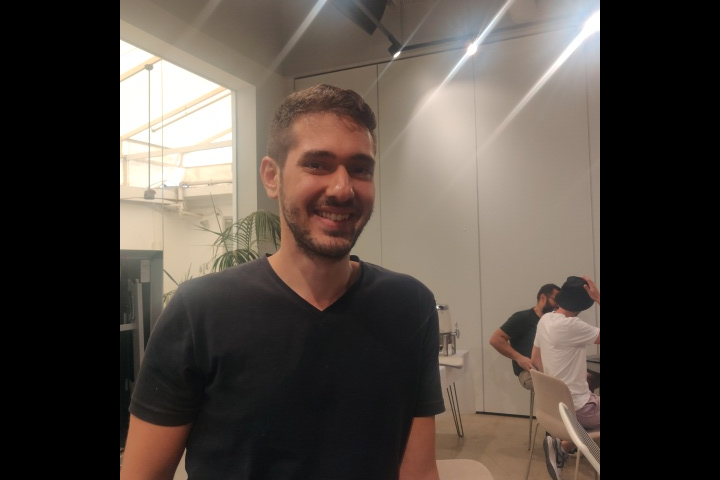

In [60]:

plot_face_rect(im, face_locations, names=['1','2','3'])


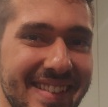

In [61]:
_ = plot_cropped_faces(image, face_locations)


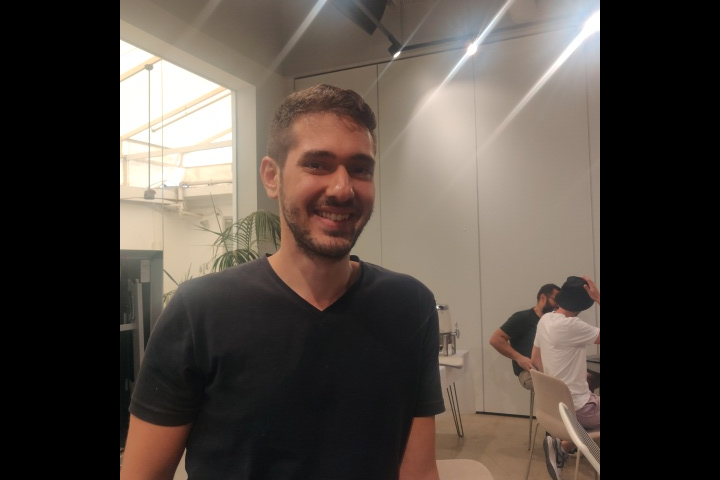

In [62]:
plot_face_rect(image, [get_most_relevant_face(im, face_locations, how='bigger')])


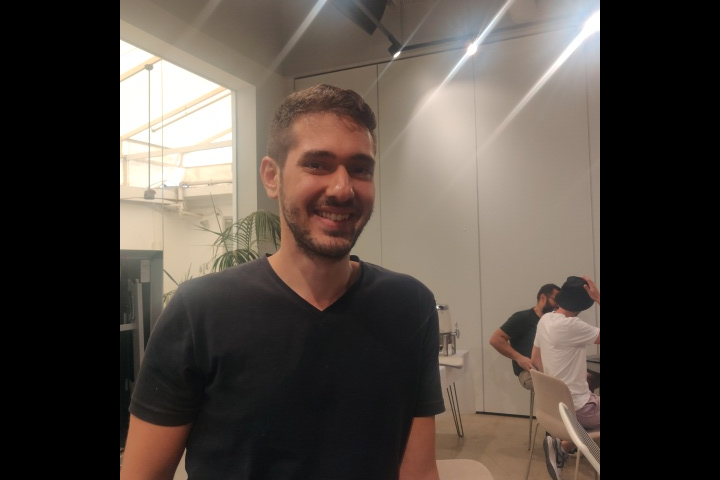

In [63]:
plot_face_rect(image, [get_most_relevant_face(image, face_locations, how='center')])

# Gettin the faces data

In [64]:
df = pd.read_json('./data/jsons/employees.json')
df.loc[:, 'avatar'] = df.about.apply(lambda x: x['avatar'])
df

,displayName,state,work,internal,about,companyId,email,surname,id,firstName,avatar
0,Danielle Hasson,active,"{'employeeIdInCompany': None, 'reportsTo': {'i...","{'status': 'Active', 'lifecycleStatus': 'emplo...",{'avatar': 'https://media-process.hibob.com/im...,51974,danielle.hasson@storemaven.com,Hasson,2397445867809276416,Danielle,https://media-process.hibob.com/image/upload/v...
1,Idan Ben-Moshe,active,"{'employeeIdInCompany': None, 'reportsTo': {'i...","{'status': 'Active', 'lifecycleStatus': 'emplo...",{'avatar': 'https://media-process.hibob.com/im...,51974,idan@storemaven.com,Ben-Moshe,2174025333978693632,Idan,https://media-process.hibob.com/image/upload/v...
2,Abigail Domnitz,active,"{'employeeIdInCompany': None, 'reportsTo': {'i...","{'status': 'Active', 'lifecycleStatus': 'emplo...",{'avatar': 'https://media-process.hibob.com/im...,51974,abigail@storemaven.com,Domnitz,2491361403412153344,Abigail,https://media-process.hibob.com/image/upload/v...
3,Suhair Zain,active,"{'employeeIdInCompany': None, 'reportsTo': {'i...","{'status': 'Active', 'lifecycleStatus': 'emplo...",{'avatar': 'https://media-process.hibob.com/im...,51974,suhair@storemaven.com,Zain,2682695221019411456,Suhair,https://media-process.hibob.com/image/upload/v...
4,Tal Sharabi,active,"{'employeeIdInCompany': None, 'reportsTo': {'i...","{'status': 'Active', 'lifecycleStatus': 'emplo...",{'avatar': 'https://media-process.hibob.com/im...,51974,tal@storemaven.com,Sharabi,2058112666760642816,Tal,https://media-process.hibob.com/image/upload/v...
5,Ido Daniel Nissim,active,"{'employeeIdInCompany': None, 'reportsTo': {'i...","{'status': 'Active', 'lifecycleStatus': 'emplo...",{'avatar': 'https://media-process.hibob.com/im...,51974,ido@storemaven.com,Nissim,2537179291150451200,Ido,https://media-process.hibob.com/image/upload/v...
6,Ofir Geller,active,"{'employeeIdInCompany': None, 'reportsTo': {'i...","{'status': 'Active', 'lifecycleStatus': 'emplo...",{'avatar': 'https://media-process.hibob.com/im...,51974,ofir@storemaven.com,Geller,2598066727879181312,Ofir,https://media-process.hibob.com/image/upload/v...
7,Adam Rakib,active,"{'employeeIdInCompany': None, 'reportsTo': {'i...","{'status': 'Active', 'lifecycleStatus': 'emplo...",{'avatar': 'https://media-process.hibob.com/im...,51974,adam@storemaven.com,Rakib,1992204165354357248,Adam,https://media-process.hibob.com/image/upload/v...
8,Eldad Abel,active,"{'employeeIdInCompany': None, 'reportsTo': {'i...","{'status': 'Active', 'lifecycleStatus': 'emplo...",{'avatar': 'https://media-process.hibob.com/im...,51974,eldad@storemaven.com,Abel,1992204165094310400,Eldad,https://media-process.hibob.com/image/upload/v...
9,Elad Baron,active,"{'employeeIdInCompany': None, 'reportsTo': {'i...","{'status': 'Active', 'lifecycleStatus': 'emplo...",{'avatar': 'https://media-process.hibob.com/im...,51974,elad.baron@storemaven.com,Baron,2397473286410731520,Elad,https://media-process.hibob.com/image/upload/v...


In [65]:
def save_faces(url, name, path='./data/players'):
    im_array = Image.open(requests.get(url, stream=True).raw)
    im_array = crop_faces(im_array, )
    im = Image.fromarray(np.asanyarray(im_array))
    px.imshow(im_array).show()
    im_path = f"{path}/{name}.jpeg"
#     im.save(im_path)
    return im_path


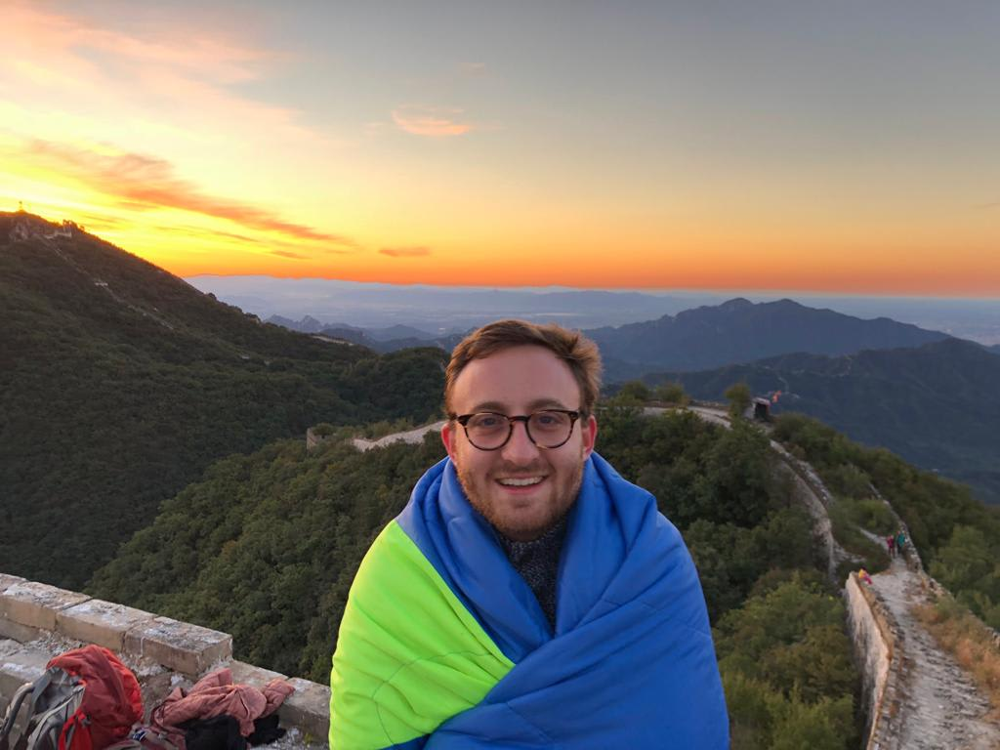

In [9]:
url = df.avatar[12]
name = df['displayName'][12]
image = face_recognition.load_image_file(requests.get(url, stream=True).raw)
px.imshow(image)

# Main functions

In [10]:
%%time
results = images_to_encodings(df.avatar)

  0%|          | 0/48 [00:00<?, ?it/s]

https://media-process.hibob.com/image/upload/v1/hibob/avatar/51974/images/86ab3ec7-227a-4940-a99d-b2f469e50c5c?token=X19jbGRfdG9rZW5fXz1leHA9MTY2NDAzMDgyNH5hY2w9KiUyZmhpYm9iJTJmYXZhdGFyJTJmNTE5NzQlMmZpbWFnZXMlMmY4NmFiM2VjNy0yMjdhLTQ5NDAtYTk5ZC1iMmY0NjllNTBjNWMqfmhtYWM9Njg4NTAwNThmM2ZhNjg0NGNkNjc0MGQwM2UwYjgwYjg0YzYyNzVlYTQxYzVmNTNmYTgxMTgyMjk0YTdmOTAyMw==&vendor=cloudinary
https://media-process.hibob.com/image/upload/v1/hibob/avatar/51974/images/182e7dfe-350a-432c-8c74-7dba6e26919a?token=X19jbGRfdG9rZW5fXz1leHA9MTY2NDAzMDgxOX5hY2w9KiUyZmhpYm9iJTJmYXZhdGFyJTJmNTE5NzQlMmZpbWFnZXMlMmYxODJlN2RmZS0zNTBhLTQzMmMtOGM3NC03ZGJhNmUyNjkxOWEqfmhtYWM9ODliMmJmM2Q1ZTUxYjEyNThlOWQ3ZGI2YTVjYzZiNmE4ZDQ2NjA2OTE5YmQ0ZmM3ZGQzNjE5ZTkxNzMxYzJmOA==&vendor=cloudinary


/Users/galfridman/Library/Caches/pypoetry/virtualenvs/face-recognition-ibepIS5N-py3.8/lib/python3.8/site-packages/PIL/Image.py:992: UserWarning:

Palette images with Transparency expressed in bytes should be converted to RGBA images



CPU times: user 27 s, sys: 2.27 s, total: 29.2 s
Wall time: 43.8 s


In [11]:
results_df = pd.DataFrame.from_dict(results, orient='index')
results_df = results_df[results_df.total_faces_found>0]
results_df.head()

,total_faces_found,encodings,rectangle
https://media-process.hibob.com/image/upload/v1/hibob/avatar/51974/images/65d397c0-1c77-438b-bbe5-00d9be15a229?token=X19jbGRfdG9rZW5fXz1leHA9MTY2NDAzMDgwOX5hY2w9KiUyZmhpYm9iJTJmYXZhdGFyJTJmNTE5NzQlMmZpbWFnZXMlMmY2NWQzOTdjMC0xYzc3LTQzOGItYmJlNS0wMGQ5YmUxNWEyMjkqfmhtYWM9ZTU3Y2EyNDljM2QwYmYzMDhhNDQwMmI1NWIyYzY2ODliOGI3NTVkNjYyNjAzYjU5NWM1NTZiNDk5M2RhOTRhMw==&vendor=cloudinary,1,"[-0.03825182467699051, 0.08732747286558151, 0....","{'y0': 63, 'x1': 204, 'y1': 138, 'x0': 129}"
https://media-process.hibob.com/image/upload/v1/hibob/avatar/51974/images/2ffd49a1-07cd-410f-a264-612d68bf6f30?token=X19jbGRfdG9rZW5fXz1leHA9MTY2NDAzMDgyOX5hY2w9KiUyZmhpYm9iJTJmYXZhdGFyJTJmNTE5NzQlMmZpbWFnZXMlMmYyZmZkNDlhMS0wN2NkLTQxMGYtYTI2NC02MTJkNjhiZjZmMzAqfmhtYWM9MDllN2IxZGU5MGFiMjFjMWZhNmQ5ZGNlNzViZjkxMjYwNjY1NzgwZTMwODQxZGI3YmY3M2E1YThiMzJmMmE4Ng==&vendor=cloudinary,1,"[-0.022503308951854706, 0.1353982537984848, 0....","{'y0': 194, 'x1': 151, 'y1': 238, 'x0': 108}"
https://media-process.hibob.com/image/upload/v1/hibob/avatar/51974/images/aefdc5cd-44dc-4fa8-b982-2cc3b08985b1?token=X19jbGRfdG9rZW5fXz1leHA9MTY2NDAzMDgxNH5hY2w9KiUyZmhpYm9iJTJmYXZhdGFyJTJmNTE5NzQlMmZpbWFnZXMlMmZhZWZkYzVjZC00NGRjLTRmYTgtYjk4Mi0yY2MzYjA4OTg1YjEqfmhtYWM9NDNlMjkyMmEzYzhlMjA1N2M2NGE3YzQyMWEyMjNlYzk1MTFhNzYxYzhhNTEyNGEyY2NkYzI1MWYxMjE0MjQ3NQ==&vendor=cloudinary,1,"[-0.03135184943675995, 0.07739932090044022, 0....","{'y0': 106, 'x1': 205, 'y1': 196, 'x0': 116}"
https://media-process.hibob.com/image/upload/v1/hibob/avatar/51974/images/72cae9d0-b298-4e3c-8f8d-71af692a54a3?token=X19jbGRfdG9rZW5fXz1leHA9MTY2NDAzMDgxNH5hY2w9KiUyZmhpYm9iJTJmYXZhdGFyJTJmNTE5NzQlMmZpbWFnZXMlMmY3MmNhZTlkMC1iMjk4LTRlM2MtOGY4ZC03MWFmNjkyYTU0YTMqfmhtYWM9ZDM1MTg2YmZjMmNmZDMxODY2YzFiNzhkMzk5NzhlNTI1NWYxZjkxMGQ0MWNmYjhhODI5NTM4YTkxNWI0NjUxNA==&vendor=cloudinary,1,"[-0.022882848978042603, 0.1254812628030777, 0....","{'y0': 31, 'x1': 146, 'y1': 74, 'x0': 103}"
https://media-process.hibob.com/image/upload/v1/hibob/avatar/51974/images/9c1b655c-b7e3-43e5-8963-84b01e2aaf34?token=X19jbGRfdG9rZW5fXz1leHA9MTY2NDAzMDgyNH5hY2w9KiUyZmhpYm9iJTJmYXZhdGFyJTJmNTE5NzQlMmZpbWFnZXMlMmY5YzFiNjU1Yy1iN2UzLTQzZTUtODk2My04NGIwMWUyYWFmMzQqfmhtYWM9NjZmNTkwZGNkYzViZjM5ZDQxNjFlNjczOWQ2N2Q3YjA4NjFjYzVlM2U2Zjk2MjUwZTg0ZDM2ZjIzNTgwOTkwYg==&vendor=cloudinary,1,"[-0.0388670340180397, 0.08238901197910309, 0.0...","{'y0': 96, 'x1': 162, 'y1': 171, 'x0': 88}"


In [12]:
%%time
match_result = find_matching_image(df.avatar[10], results_df.encodings.to_dict())

CPU times: user 1.97 s, sys: 162 ms, total: 2.13 s
Wall time: 2.41 s


In [13]:
match_result

{'rectangle': {'y0': 26, 'x1': 234, 'y1': 124, 'x0': 136},
 'distance': 0.0,
 'matching_url': 'https://media-process.hibob.com/image/upload/v1/hibob/avatar/51974/images/63d8d9ed-f776-42fb-86da-f1c958345ad6?token=X19jbGRfdG9rZW5fXz1leHA9MTY2NDAzMDgxNH5hY2w9KiUyZmhpYm9iJTJmYXZhdGFyJTJmNTE5NzQlMmZpbWFnZXMlMmY2M2Q4ZDllZC1mNzc2LTQyZmItODZkYS1mMWM5NTgzNDVhZDYqfmhtYWM9MDQ5YTZlNmE0YTM3MWEyOGJmZDI3MDI3ZDkxZDljMTBiNmNlNmNiOTM4NDAxYWE5MDZkNjBmZTAxZjQ2YzIyNQ==&vendor=cloudinary',
 'encodings': array([-0.03667619,  0.10546422,  0.03779238, -0.01942646, -0.09024934,
        -0.0300127 , -0.0979016 , -0.02955111,  0.16192363, -0.03252529,
         0.26086581,  0.00616402, -0.25286779, -0.04323843, -0.00965743,
         0.11488847, -0.15504104, -0.04540892, -0.12395844, -0.10225138,
         0.04342106, -0.03206323,  0.02641998,  0.02883353, -0.15472464,
        -0.26728871, -0.08744341, -0.13410543,  0.08573347, -0.19137961,
         0.00883947,  0.0427234 , -0.12487654, -0.0419399 , -0.01908003,
   

In [78]:
results_df

,total_faces_found,encodings,rectangle
https://media-process.hibob.com/image/upload/v1/hibob/avatar/51974/images/65d397c0-1c77-438b-bbe5-00d9be15a229?token=X19jbGRfdG9rZW5fXz1leHA9MTY2NDAzMDgwOX5hY2w9KiUyZmhpYm9iJTJmYXZhdGFyJTJmNTE5NzQlMmZpbWFnZXMlMmY2NWQzOTdjMC0xYzc3LTQzOGItYmJlNS0wMGQ5YmUxNWEyMjkqfmhtYWM9ZTU3Y2EyNDljM2QwYmYzMDhhNDQwMmI1NWIyYzY2ODliOGI3NTVkNjYyNjAzYjU5NWM1NTZiNDk5M2RhOTRhMw==&vendor=cloudinary,1,"[-0.03825182467699051, 0.08732747286558151, 0....","{'y0': 63, 'x1': 204, 'y1': 138, 'x0': 129}"
https://media-process.hibob.com/image/upload/v1/hibob/avatar/51974/images/2ffd49a1-07cd-410f-a264-612d68bf6f30?token=X19jbGRfdG9rZW5fXz1leHA9MTY2NDAzMDgyOX5hY2w9KiUyZmhpYm9iJTJmYXZhdGFyJTJmNTE5NzQlMmZpbWFnZXMlMmYyZmZkNDlhMS0wN2NkLTQxMGYtYTI2NC02MTJkNjhiZjZmMzAqfmhtYWM9MDllN2IxZGU5MGFiMjFjMWZhNmQ5ZGNlNzViZjkxMjYwNjY1NzgwZTMwODQxZGI3YmY3M2E1YThiMzJmMmE4Ng==&vendor=cloudinary,1,"[-0.022503308951854706, 0.1353982537984848, 0....","{'y0': 194, 'x1': 151, 'y1': 238, 'x0': 108}"
https://media-process.hibob.com/image/upload/v1/hibob/avatar/51974/images/aefdc5cd-44dc-4fa8-b982-2cc3b08985b1?token=X19jbGRfdG9rZW5fXz1leHA9MTY2NDAzMDgxNH5hY2w9KiUyZmhpYm9iJTJmYXZhdGFyJTJmNTE5NzQlMmZpbWFnZXMlMmZhZWZkYzVjZC00NGRjLTRmYTgtYjk4Mi0yY2MzYjA4OTg1YjEqfmhtYWM9NDNlMjkyMmEzYzhlMjA1N2M2NGE3YzQyMWEyMjNlYzk1MTFhNzYxYzhhNTEyNGEyY2NkYzI1MWYxMjE0MjQ3NQ==&vendor=cloudinary,1,"[-0.03135184943675995, 0.07739932090044022, 0....","{'y0': 106, 'x1': 205, 'y1': 196, 'x0': 116}"
https://media-process.hibob.com/image/upload/v1/hibob/avatar/51974/images/72cae9d0-b298-4e3c-8f8d-71af692a54a3?token=X19jbGRfdG9rZW5fXz1leHA9MTY2NDAzMDgxNH5hY2w9KiUyZmhpYm9iJTJmYXZhdGFyJTJmNTE5NzQlMmZpbWFnZXMlMmY3MmNhZTlkMC1iMjk4LTRlM2MtOGY4ZC03MWFmNjkyYTU0YTMqfmhtYWM9ZDM1MTg2YmZjMmNmZDMxODY2YzFiNzhkMzk5NzhlNTI1NWYxZjkxMGQ0MWNmYjhhODI5NTM4YTkxNWI0NjUxNA==&vendor=cloudinary,1,"[-0.022882848978042603, 0.1254812628030777, 0....","{'y0': 31, 'x1': 146, 'y1': 74, 'x0': 103}"
https://media-process.hibob.com/image/upload/v1/hibob/avatar/51974/images/9c1b655c-b7e3-43e5-8963-84b01e2aaf34?token=X19jbGRfdG9rZW5fXz1leHA9MTY2NDAzMDgyNH5hY2w9KiUyZmhpYm9iJTJmYXZhdGFyJTJmNTE5NzQlMmZpbWFnZXMlMmY5YzFiNjU1Yy1iN2UzLTQzZTUtODk2My04NGIwMWUyYWFmMzQqfmhtYWM9NjZmNTkwZGNkYzViZjM5ZDQxNjFlNjczOWQ2N2Q3YjA4NjFjYzVlM2U2Zjk2MjUwZTg0ZDM2ZjIzNTgwOTkwYg==&vendor=cloudinary,1,"[-0.0388670340180397, 0.08238901197910309, 0.0...","{'y0': 96, 'x1': 162, 'y1': 171, 'x0': 88}"
https://media-process.hibob.com/image/upload/v1/hibob/avatar/51974/images/b595c0d0-3078-4453-9cff-ab7485cacf75?token=X19jbGRfdG9rZW5fXz1leHA9MTY2NDAzMDgyNH5hY2w9KiUyZmhpYm9iJTJmYXZhdGFyJTJmNTE5NzQlMmZpbWFnZXMlMmZiNTk1YzBkMC0zMDc4LTQ0NTMtOWNmZi1hYjc0ODVjYWNmNzUqfmhtYWM9MWU2ZjY5MDBjMzA1OTk0NjVjMjczYTUxNWQyNjE1MzY2YTgwMzk4YTk4YzM1N2YyYmFmZGMxMjA1NzAzYmMxMw==&vendor=cloudinary,1,"[-0.04962784796953201, 0.11496147513389587, 0....","{'y0': 104, 'x1': 136, 'y1': 203, 'x0': 38}"
https://media-process.hibob.com/image/upload/v1/hibob/avatar/51974/images/6758e74b-19e2-4c35-9d30-41c3d5d185a5?token=X19jbGRfdG9rZW5fXz1leHA9MTY2NDAzMDgxNH5hY2w9KiUyZmhpYm9iJTJmYXZhdGFyJTJmNTE5NzQlMmZpbWFnZXMlMmY2NzU4ZTc0Yi0xOWUyLTRjMzUtOWQzMC00MWMzZDVkMTg1YTUqfmhtYWM9ODY3MjQ1ZDRjZGFkZTEzNjJhOTkxZjI2NTI4MGEzODdkMTQwNTUzNmM3MWM5ZWNiZjNkMmRhZDRjODcyODJjMQ==&vendor=cloudinary,1,"[-0.030166760087013245, 0.09677547216415405, 0...","{'y0': 71, 'x1': 179, 'y1': 128, 'x0': 123}"
https://media-process.hibob.com/image/upload/v1/hibob/avatar/51974/images/809a61f0-d569-4847-b146-b2b234ec73e9?token=X19jbGRfdG9rZW5fXz1leHA9MTY2NDAzMDgxNH5hY2w9KiUyZmhpYm9iJTJmYXZhdGFyJTJmNTE5NzQlMmZpbWFnZXMlMmY4MDlhNjFmMC1kNTY5LTQ4NDctYjE0Ni1iMmIyMzRlYzczZTkqfmhtYWM9MGU1OGY1ZTU1MDY1OTU3MWFiNDA0NDIyYmU5M2Y2ZTM5Yzc1ZmI4ZGY0YmNjMzI5YjdjOTk4MjFjNTRlNjNkZg==&vendor=cloudinary,1,"[-0.12374463677406311, 0.1527806967496872, 0.0...","{'y0': 150, 'x1': 390, 'y1': 305, 'x0': 236}"
https://media-process.hibob.com/image/upload/v1/hibob/avatar/51974/images/4b6ac355-71b2-4612-a7fb-861041fdbd0f?token=X19jbGRfdG9rZW5fXz1leHA9MTY2NDAzMDg


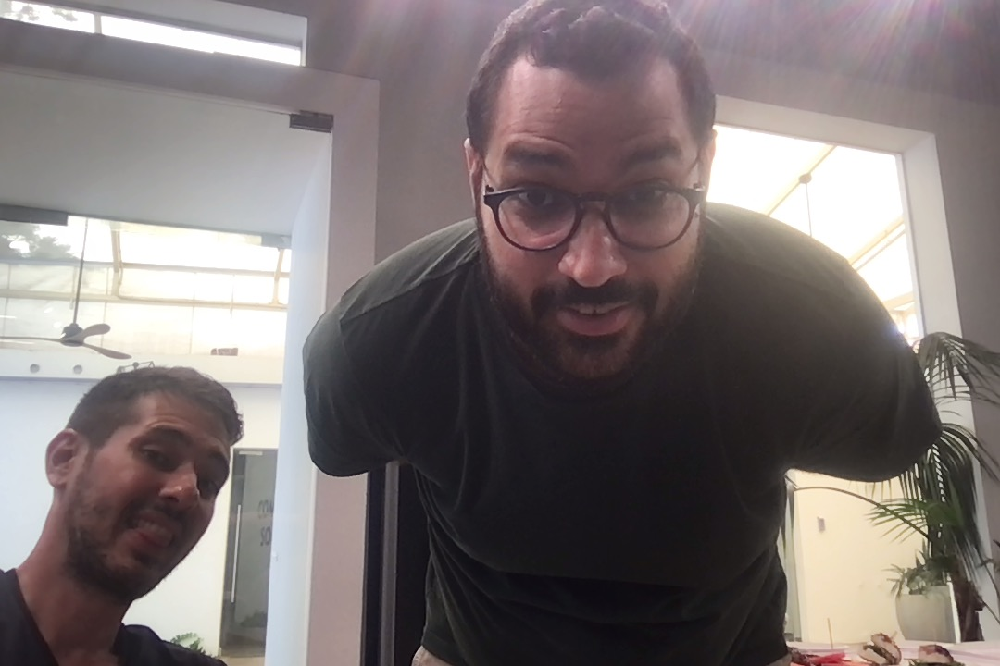


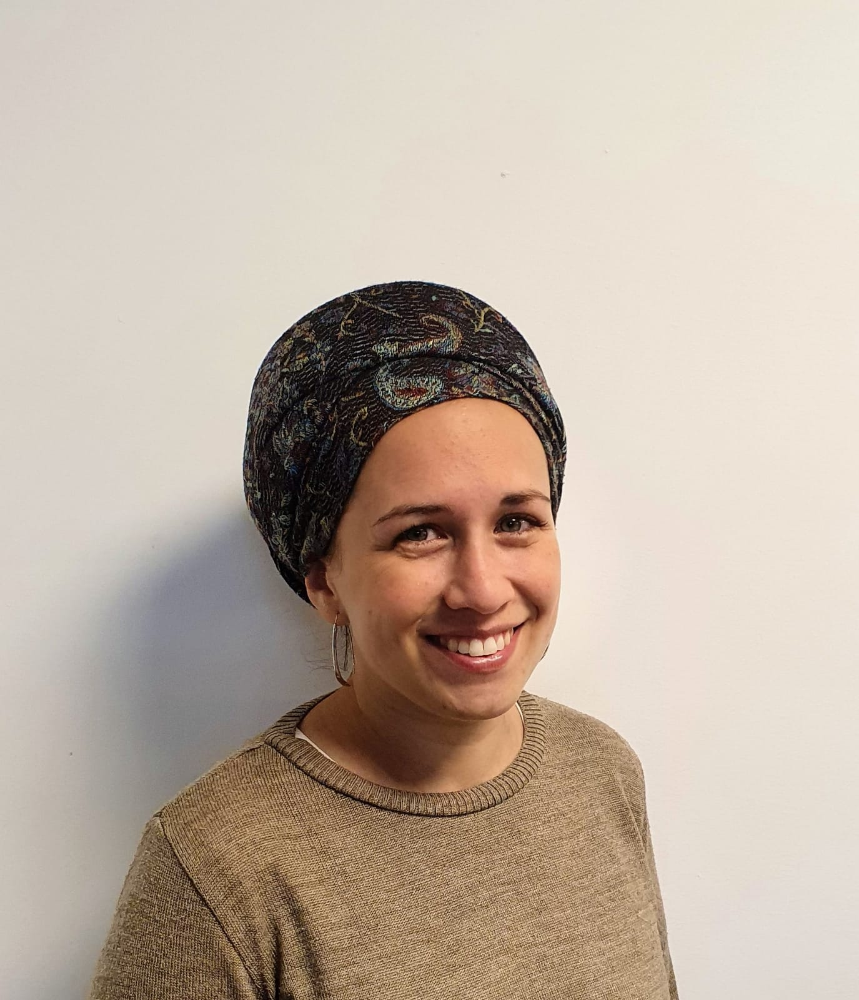

In [109]:
# image_path = "./data/images/da8efce4-36a7-476b-86a4-66db9347c613.jpeg"
image_path = "/Users/galfridman/repos/gal/face-recognition/data/images/eliran-gal.jpg"
# # url = "https://files.slack.com/files-pri/T02HXAWHS-F03HZPUE867/1654166567973.jpg"
# url = "https://drive.google.com/file/d/1ttCkOjD5Uv06O1EsOMKz94TN0aMXttWx/view?usp=sharing"
# image = face_recognition.load_image_file(requests.get(url, stream=True).raw)
image = face_recognition.load_image_file(image_path)
face_locations = face_recognition.face_locations(image, model='hog') or face_recognition.face_locations(image, model='cnn')
plot_face_rect(image, face_locations).show()
image_encodings = face_recognition.face_encodings(image, face_locations)
# image_encodings = match_result['encodings'][0]
all_encodings = np.stack(results_df.encodings.values)
names = []
for i in range(len(image_encodings)):
    matches = face_recognition.compare_faces(all_encodings, image_encodings[i], tolerance=0.65)
    person_found = results_df[matches]
    if len(person_found):
        names.append(person_found.iloc[0])
    else:
        names.append('Unknown')

image = face_recognition.load_image_file(requests.get(person_found.index[0], stream=True).raw)
locations = face_recognition.face_locations(image)
plot_face_rect(image, locations)

In [102]:
person_found

,total_faces_found,encodings,rectangle
https://media-process.hibob.com/image/upload/v1/hibob/avatar/51974/images/6f3baccb-100a-4326-ada6-beb2d62f166b?token=X19jbGRfdG9rZW5fXz1leHA9MTY2NDAzMDgyNH5hY2w9KiUyZmhpYm9iJTJmYXZhdGFyJTJmNTE5NzQlMmZpbWFnZXMlMmY2ZjNiYWNjYi0xMDBhLTQzMjYtYWRhNi1iZWIyZDYyZjE2NmIqfmhtYWM9YzZkMzQ0NDJiMjRkYzc1NTg5Mjk0MzE0NWY5ZmI5NmUyMmJmNmRmODQ1ZTA5MzMyNzQwODJhMzAzMDdmZTY0Nw==&vendor=cloudinary,1,"[-0.15064412355422974, 0.17092667520046234, 0....","{'y0': 92, 'x1': 593, 'y1': 199, 'x0': 485}"


In [87]:
person_found

,total_faces_found,encodings,rectangle
https://media-process.hibob.com/image/upload/v1/hibob/avatar/51974/images/6f3baccb-100a-4326-ada6-beb2d62f166b?token=X19jbGRfdG9rZW5fXz1leHA9MTY2NDAzMDgyNH5hY2w9KiUyZmhpYm9iJTJmYXZhdGFyJTJmNTE5NzQlMmZpbWFnZXMlMmY2ZjNiYWNjYi0xMDBhLTQzMjYtYWRhNi1iZWIyZDYyZjE2NmIqfmhtYWM9YzZkMzQ0NDJiMjRkYzc1NTg5Mjk0MzE0NWY5ZmI5NmUyMmJmNmRmODQ1ZTA5MzMyNzQwODJhMzAzMDdmZTY0Nw==&vendor=cloudinary,1,"[-0.15064412355422974, 0.17092667520046234, 0....","{'y0': 92, 'x1': 593, 'y1': 199, 'x0': 485}"



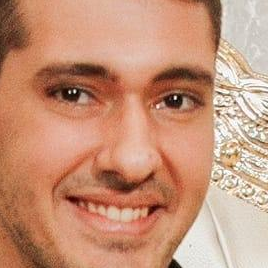

[array([[[ 66,  39,  30],
         [ 71,  44,  33],
         [ 78,  50,  38],
         ...,
         [213, 204, 195],
         [212, 203, 194],
         [209, 202, 192]],
 
        [[ 66,  39,  28],
         [ 71,  45,  32],
         [ 78,  50,  38],
         ...,
         [210, 201, 192],
         [210, 201, 192],
         [208, 201, 191]],
 
        [[ 67,  39,  28],
         [ 72,  44,  32],
         [ 78,  48,  37],
         ...,
         [212, 203, 194],
         [213, 204, 195],
         [211, 204, 194]],
 
        ...,
 
        [[187, 118,  79],
         [189, 120,  81],
         [191, 119,  81],
         ...,
         [227, 224, 215],
         [229, 226, 217],
         [230, 227, 218]],
 
        [[189, 120,  81],
         [192, 123,  84],
         [195, 123,  85],
         ...,
         [229, 226, 219],
         [227, 224, 217],
         [233, 230, 223]],
 
        [[190, 121,  82],
         [194, 125,  86],
         [198, 126,  88],
         ...,
         [230, 227, 220],
  

In [85]:
url = "https://scontent.ftlv21-1.fna.fbcdn.net/v/t1.6435-9/164802179_10222945328596030_4799476782296580881_n.jpg?_nc_cat=111&ccb=1-7&_nc_sid=09cbfe&_nc_ohc=b2M4tuDFI8gAX-GA5zn&_nc_ht=scontent.ftlv21-1.fna&oh=00_AT_0zQl-RGZUkZ2EC9luayY4X6mUA9oZE-mT6H0Du23L-Q&oe=62BE0F6C"
image = face_recognition.load_image_file(requests.get(url, stream=True).raw)
locations = face_recognition.face_locations(image)
plot_cropped_faces(image, locations)


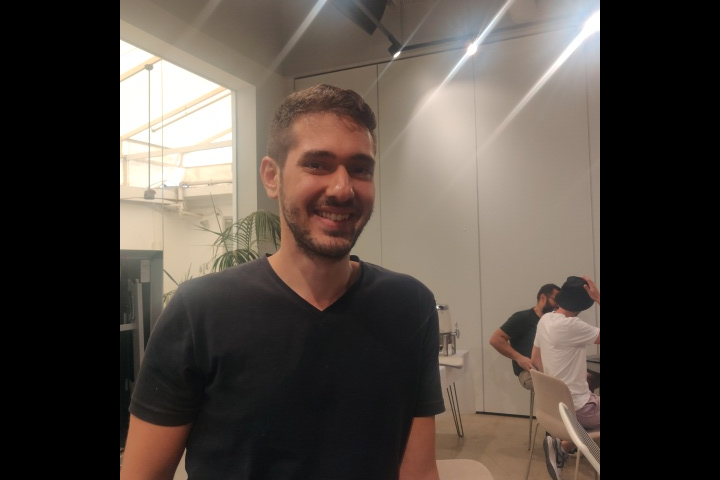

In [83]:
fig = plot_face_rect(image, face_locations, names=names)
person_killed_location = get_most_relevant_face(image,face_locations)
fig = plot_face_rect(image, [person_killed_location], names=names, fig=fig, color='red')
fig

In [16]:
import PIL
_img = PIL.Image.fromarray(image, "RGB")

In [17]:
str(_img)

'<PIL.Image.Image image mode=RGB size=946x2048 at 0x12D3BD970>'

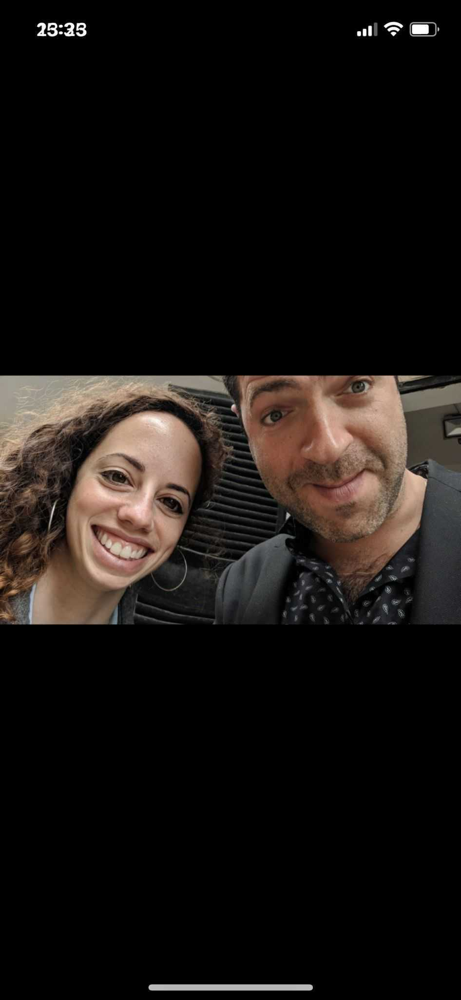

In [18]:
_img.crop()

In [19]:
df[matches]

NameError: name 'matches' is not defined

In [20]:
image_encodings

[array([-0.06142265,  0.04594199,  0.0084224 , -0.04099436, -0.06657064,
        -0.00541866, -0.08097008, -0.13867635,  0.16545634, -0.14105172,
         0.15356666,  0.05172286, -0.22312121,  0.0211339 , -0.04324906,
         0.20407264, -0.1908001 , -0.12173673, -0.05888958, -0.06903128,
         0.03423179, -0.02109907,  0.06055269,  0.15420189, -0.10854129,
        -0.34719566, -0.09242834, -0.12119886, -0.01253316, -0.08230342,
         0.03552557,  0.04171564, -0.13200192,  0.12367077,  0.00517931,
         0.02048248, -0.0259345 , -0.11463784,  0.14926484,  0.05332466,
        -0.21968809,  0.06553072, -0.06421683,  0.24030598,  0.21112329,
        -0.05350894,  0.11830816, -0.0415289 ,  0.12100235, -0.29010391,
        -0.05360914,  0.10673471,  0.02717168,  0.01058032,  0.0285143 ,
        -0.17241232,  0.02370629,  0.07531465, -0.14580961,  0.05601686,
        -0.0124673 , -0.08807574, -0.02189352,  0.02870681,  0.18547764,
         0.16168085, -0.18377492, -0.14461572,  0.1

In [21]:
encoded_image

NameError: name 'encoded_image' is not defined

In [22]:
import sys
encoded_image = fig.to_image(format='jpeg')

In [23]:
from PIL import Image
Image.open(encoded_image,formats=['jpeg'])

ValueError: embedded null byte

In [ ]:
success, a_numpy = cv2.imencode('.jpg', fig)
a = a_numpy.tostring()

In [ ]:
data = pd.read_json('./data/images_to_encodings_respones.json', orient='index')

In [ ]:
match_result = find_matching_image(df.avatar[10], data.encodings.to_dict())

In [ ]:
match_result

In [ ]:
boxes = face_recognition.face_locations(image, model=args["detection_method"])